# Debugging notebook for preprocess_mvtec_to_boxes.py

This notebook will sample random pictures from our dataset and will show them and plot their bounding boxes.  

We will use the **Capsule** data from the [MVTec AD dataset](https://www.mvtec.com/company/research/datasets/mvtec-ad).  
The data is released under the *Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License (CC BY-NC-SA 4.0)*.  
The dataset is used strictly for non-commercial, educational purposes.

Because the dataset provides pixel wise mask pictures for the defects, and our main project will use bounding boxes, we created a script that defines bounding boxes from this masks and exports the annotations as a csv file.  


This notebook:  
- Randomly samples images from the dataset  
- Loads the corresponding bounding boxes  
- Overlays the boxes on the images for visual inspection  

The goal is to verify that the preprocessing script correctly extracted and labeled bounding boxes from the original defect masks.  

In [1]:
# Imports
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import random

In [2]:
# Load annotations CSV
df = pd.read_csv('../data/capsule/annotations.csv')

# Check the first few rows of the DataFrame
df.head()

,image_path,class_name,x_min,y_min,x_max,y_max
0,../data/capsule/train/good/095.png,good,NaN,NaN,NaN,NaN
1,../data/capsule/train/good/036.png,good,NaN,NaN,NaN,NaN
2,../data/capsule/train/good/028.png,good,NaN,NaN,NaN,NaN
3,../data/capsule/train/good/039.png,good,NaN,NaN,NaN,NaN
4,../data/capsule/train/good/149.png,good,NaN,NaN,NaN,NaN


In [3]:
# Function to get an image and overlay its bounding box
def plot_image_with_boxes(image_path, boxes, labels, figsize=(8, 8)):
    img = cv2.imread(str(image_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for box, label in zip(boxes, labels):
        if box:  # only draw if box exists
            x_min, y_min, x_max, y_max = box
            cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)
            cv2.putText(img, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [4]:
# Get a random subset of unique image paths
sample_paths = random.sample(list(df['image_path'].values), 15)

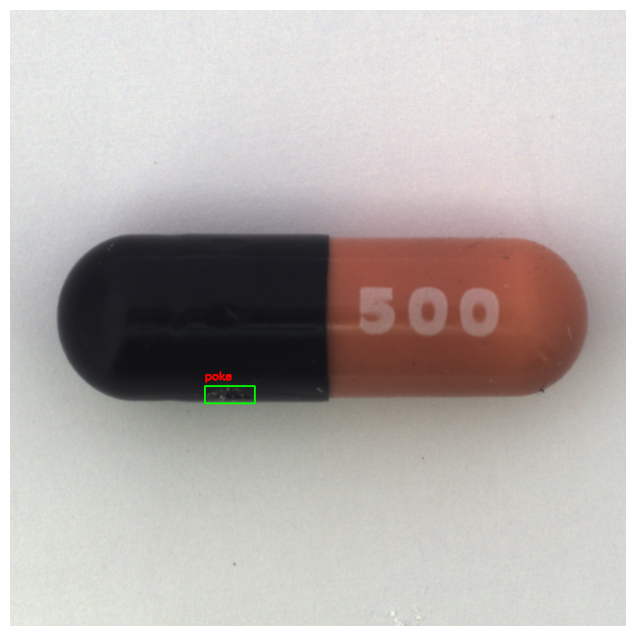

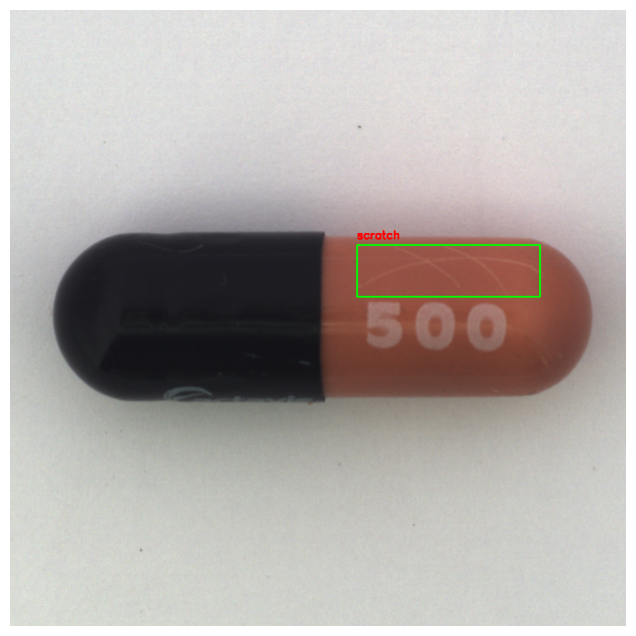

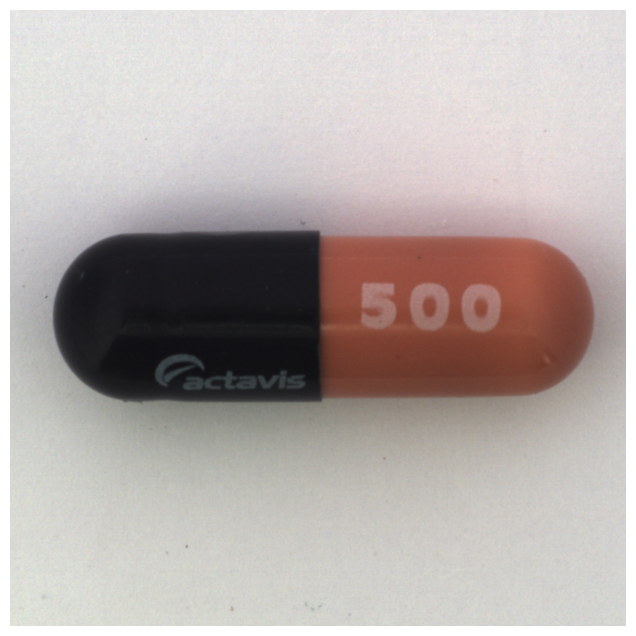

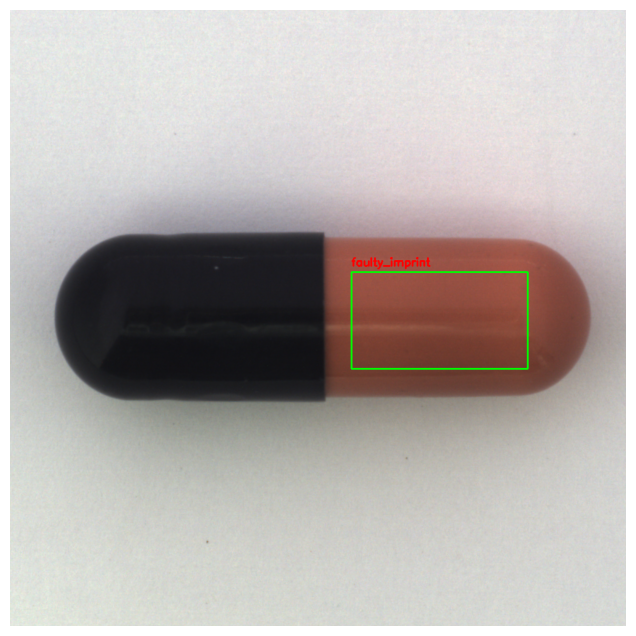

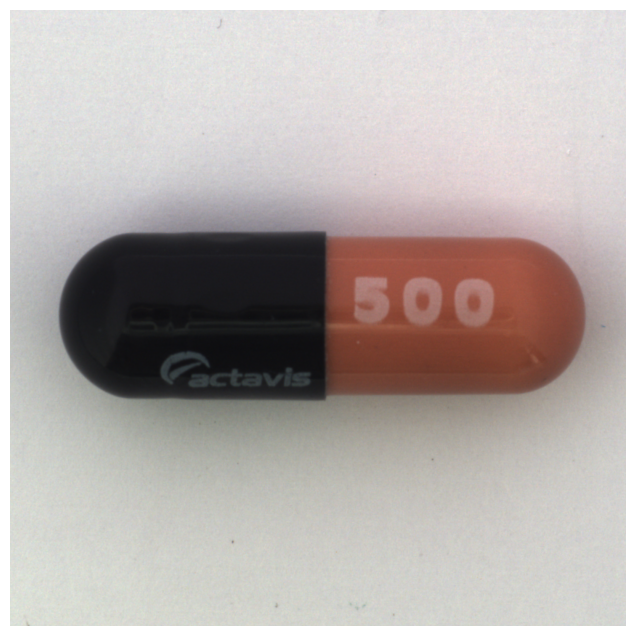

...

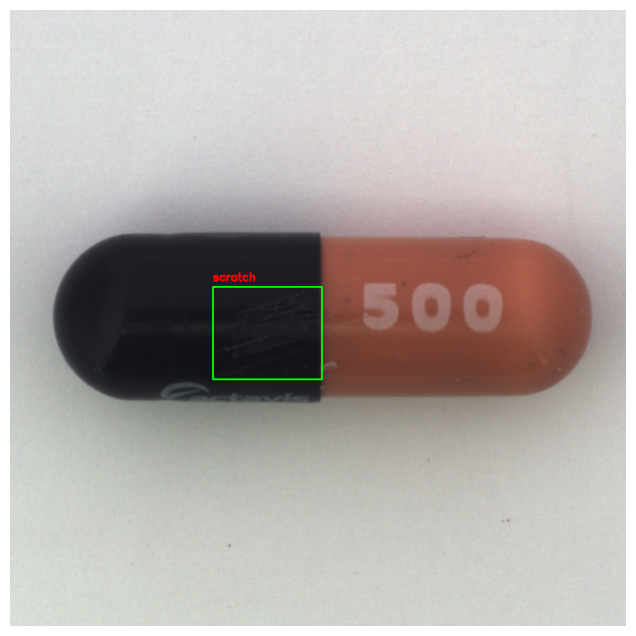

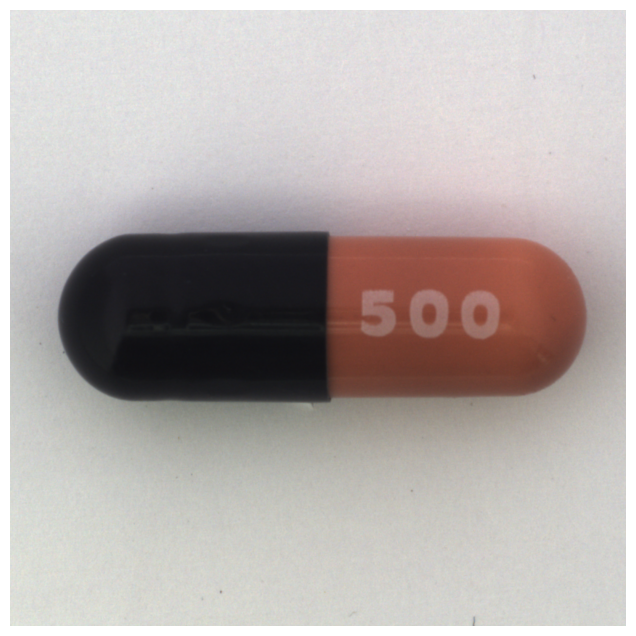

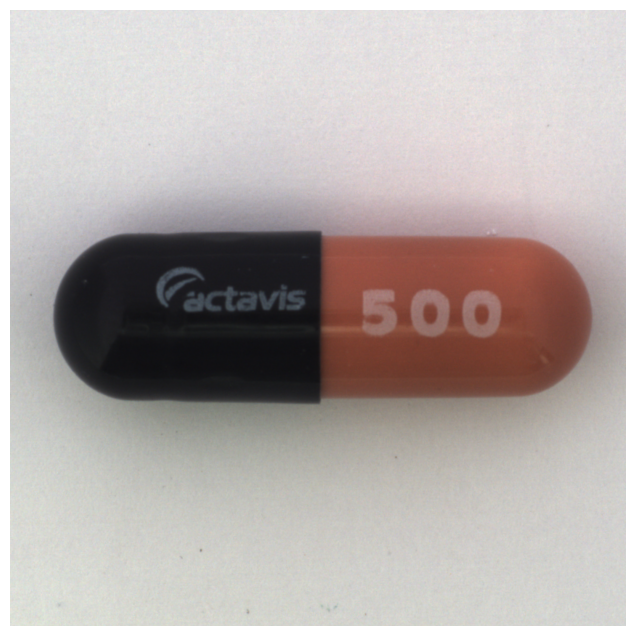

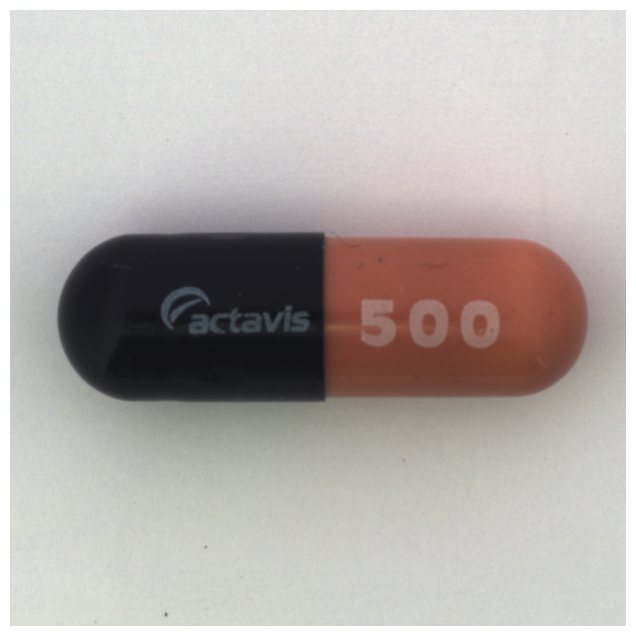

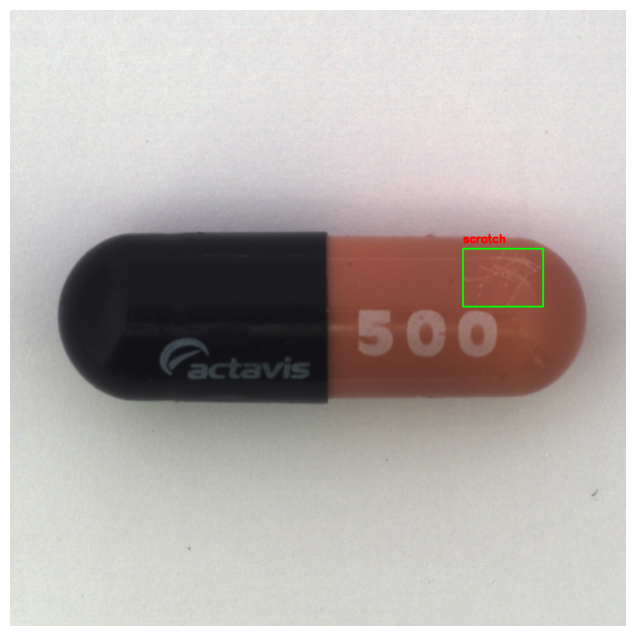

In [5]:
# Iterate through the sample paths and plot images with bounding boxes
for img_path in sample_paths:
    # Get all annotations for this image
    img_annots = df[df['image_path'] == img_path]
    
    boxes = []
    labels = []

    for _, row in img_annots.iterrows():
        cls = row['class_name']
        # Some images (good ones) don't have box values
        if pd.isna(row['x_min']):
            boxes.append(None)
        else:
            box = [int(row['x_min']), int(row['y_min']), int(row['x_max']), int(row['y_max'])]
            boxes.append(box)
        labels.append(cls)

    plot_image_with_boxes(img_path, boxes, labels)